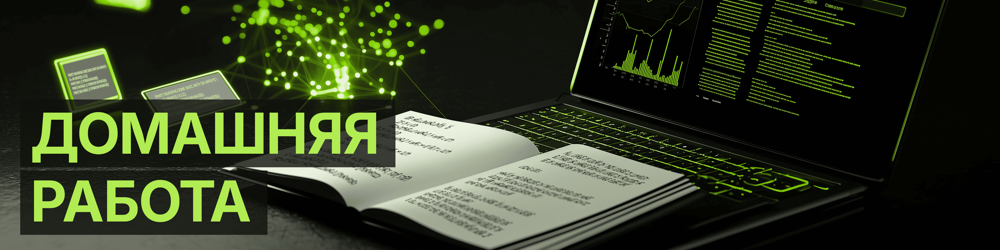

**Навигация по уроку**
1. [Обучение с подкреплением. Основы](https://colab.research.google.com/drive/1Jj_fjuvjcOPzibifkFaVRgfXKO6ASafi)
2. [OpenAI Gym. Простейшие алгоритмы обучения](https://colab.research.google.com/drive/1KvKL7ySnZOBuGFUn8m1QUbQTH5Y00DHf)
3. Домашняя работа

В домашней работе вам необходимо обучить модель играть в игры Atari.
Для этого необходимо установить библиотеки:

In [ ]:
!pip install "gymnasium[atari]"
!pip install autorom[accept-rom-license]

Для игр Atari лучше использовать форк gymnasium, он более стабильный и нет проблем с зависимостями, для работы достаточно зарегистрировать окружение:

In [ ]:
import gymnasium as gym
import ale_py

gym.register_envs(ale_py)

В качестве игры выберите игру pac-man или любую другую из набора Atari, например, из этого [списка](https://www.gymlibrary.dev/environments/atari/index.html).

Как говорил Генри Форд: "Вы можете выбрать любой цвет для машины, только если он будет черным!" Также и в домашней работе, вы можете выбрать любую игру, только если она имеет более 4-х элементов управления.

Создание окружения для Pac-Man:

In [ ]:
env = gym.make("ALE/MsPacman-v5")

В домашней работе вам необходимо выполнить одно из трёх заданий на выбор:

**Задание 1. На 3 балла:**

1. Используя Gym Atari, выберите любую игру с более чем 4-мя действиями.
2. Обучите игру на стратегиях случайного поиска и восхождения на вершину.

**Задание 2. На 4 балла:**

1. Используя Gym Atari, выберите любую игру с более чем 4-мя действиями.
2. Обучите игру на стратегиях случайного поиска и восхождения на вершину.
3. Создайте видео с наибольшим вознаграждением и вставьте его в колаб.
  

**Задание 3. На 5 балла:**

1. Используя Gym Atari, выберите любую игру с более чем 4-мя действиями.
2. Обучите игру на стратегии градиента стратегии (градиентной политики).
3. Создайте видео из нескольких игровых эпизодов, в котором модель достигла максимального вознаграждения.
4. Попробуйте по видео объяснить почему алгоритм градиента стратегии плохо подходит для данной задачи. Результат вознаграждения будет ХУЖЕ случайного.
5. Задача выполняется самостоятельно без помощи куратора!

In [ ]:
!pip install "gymnasium[atari]"
!pip install autorom[accept-rom-license]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.7/434.7 kB 23.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for AutoROM.accept-rom-license: filename=autorom_accept_rom_license-0.6.1-py3-none-any.whl size=446709 sha256=b6ded4e6d13c6bdaae9bf49aa442cdfcf35b922e332e268b1b3a9d3d67110306
  Stored in directory: /root/.cache/pip/wheels/bc/fc/c6/8aa657c0d2089982f2dabd110efc68c61eb49831fdb7397351
Successfully built AutoROM.accept-rom-license


In [ ]:
import gymnasium as gym
import ale_py
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display # Добавил 'display' для корректного отображения видео
import io
import base64

# Регистрация окружений Atari
gym.register_envs(ale_py)

In [ ]:

# Определение сети политики (PolicyNetwork)
# Наблюдения в MsPacman - это изображения (210, 160, 3), что представляет собой очень высокоразмерное пространство состояний.
# Простой линейный слой (как в примерах CartPole) недостаточен.
# Мы будем использовать простую сверточную нейронную сеть (CNN) для обработки изображений-наблюдений.
class PolicyNetwork(nn.Module):
    def __init__(self, num_actions):
        super(PolicyNetwork, self).__init__()
        # Вход: (batch_size, 3, 210, 160) - каналы первыми для PyTorch
        self.conv1 = nn.Conv2d(3, 16, kernel_size=8, stride=4) # Выход: (batch_size, 16, 51, 38)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(16, 32, kernel_size=4, stride=2) # Выход: (batch_size, 32, 24, 18)
        self.relu2 = nn.ReLU()
        # Вычисление размера свернутого выхода из сверточных слоев
        self._recompute_output_shape(210, 160)
        self.fc1 = nn.Linear(self.flat_features, 256)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(256, num_actions)

    def _recompute_output_shape(self, height, width):
        # Вспомогательная функция для вычисления формы выхода сверточных слоев
        # Это необходимо для определения размера входа для первого полносвязного слоя
        x = torch.zeros(1, 3, height, width)
        x = self.relu1(self.conv1(x))
        x = self.relu2(self.conv2(x))
        self.flat_features = x.view(x.size(0), -1).size(1)

    def forward(self, x):
        # Изменение порядка измерений входа с (H, W, C) на (C, H, W) для CNN PyTorch
        x = x.permute(2, 0, 1).unsqueeze(0).float() / 255.0 # Нормализация значений пикселей
        x = self.relu1(self.conv1(x))
        x = self.relu2(self.conv2(x))
        x = x.view(x.size(0), -1) # Развертывание выхода для полносвязного слоя
        x = self.relu3(self.fc1(x))
        return self.fc2(x) # Выходные логиты для действий

# Функция для запуска одного эпизода и сбора вознаграждений и логарифмов вероятностей
def run_episode(env, policy_net, optimizer):
    # Сброс окружения и получение начального состояния
    state, _ = env.reset()
    done = False
    total_reward = 0
    log_probs = [] # Список для хранения логарифмов вероятностей выбранных действий
    rewards = []   # Список для хранения полученных вознаграждений

    while not done:
        # Преобразование состояния (массив numpy) в тензор PyTorch
        state_tensor = torch.from_numpy(state).float()

        # Получение вероятностей действий из сети политики
        logits = policy_net(state_tensor)
        # Применение softmax для получения вероятностей, затем создание категориального распределения
        probs = torch.nn.functional.softmax(logits, dim=-1)
        m = torch.distributions.Categorical(probs)

        # Выбор действия из распределения
        action = m.sample()

        # Сохранение логарифма вероятности выбранного действия
        log_probs.append(m.log_prob(action))

        # Выполнение действия в окружении
        state, reward, done, truncated, _ = env.step(action.item())
        rewards.append(reward)
        total_reward += reward

        if truncated:
            done = True

    # Вычисление дисконтированных вознаграждений
    discounted_rewards = []
    R = 0
    gamma = 0.99 # Коэффициент дисконтирования
    for r in rewards[::-1]: # Итерация в обратном порядке
        R = r + gamma * R
        discounted_rewards.insert(0, R) # Вставка в начало для сохранения порядка

    # Преобразование в тензор и нормализация
    discounted_rewards = torch.tensor(discounted_rewards)
    # Избегаем деления на ноль, если все вознаграждения одинаковы (например, все нули)
    if len(discounted_rewards) > 1:
        discounted_rewards = (discounted_rewards - discounted_rewards.mean()) / (discounted_rewards.std() + 1e-9)
    else: # Обработка случая с одним или нулевым вознаграждением для предотвращения NaN
        discounted_rewards = torch.zeros_like(discounted_rewards)


    # Вычисление функции потерь для градиента политики
    # Потери = - (log_prob * discounted_reward).sum()
    # Мы хотим максимизировать вознаграждение, поэтому минимизируем отрицательное значение (log_prob * reward)
    policy_loss = []
    for log_prob, R in zip(log_probs, discounted_rewards):
        policy_loss.append(-log_prob * R)

    # Обратное распространение ошибки и обновление весов
    optimizer.zero_grad()
    if policy_loss: # Только обратное распространение, если есть потери
        loss = torch.cat(policy_loss).sum()
        loss.backward()
        optimizer.step()

    return total_reward

In [ ]:

# Функция для создания и отображения видео
def create_video(frames, title="Игровой процесс MsPacman"):
    """
    Создает и возвращает HTML-видео из списка кадров.

    Параметры:
    frames (list): Список numpy массивов, где каждый массив представляет кадр изображения (H, W, C).
    title (str): Заголовок видео.

    Возвращает:
    IPython.display.HTML: Объект HTML, содержащий встроенное видео.
    """
    if not frames:
        print("Нет кадров для создания видео.")
        return None

    # Увеличение размера фигуры для более крупного вывода видео
    fig = plt.figure(figsize=(frames[0].shape[1] / 50.0, frames[0].shape[0] / 50.0), dpi=72)
    patch = plt.imshow(frames[0])
    plt.axis('off') # Отключение осей для чистого отображения видео

    def animate(i):
        # Обновление данных изображения для каждого кадра анимации
        patch.set_data(frames[i])

    # Создание анимации с использованием FuncAnimation
    anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=50)

    # Преобразование анимации в HTML5 видео и возврат объекта HTML для корректного отображения
    html_video = HTML(anim.to_jshtml())
    plt.close(fig) # Закрыть фигуру, чтобы она не отображалась дважды
    return html_video


In [ ]:
# --- Основная часть обучения и генерации видео ---
if __name__ == '__main__':
    # Создание окружения для обучения (rgb_array для наблюдений)
    env_train = gym.make("ALE/MsPacman-v5", render_mode='rgb_array')
    num_actions = env_train.action_space.n

    # Инициализация сети политики и оптимизатора
    policy_net = PolicyNetwork(num_actions)
    optimizer = optim.Adam(policy_net.parameters(), lr=1e-4) # Меньшая скорость обучения для стабильности

    n_episodes = 100 # Количество эпизодов обучения
    max_reward_achieved = -float('inf')
    best_frames = []
    best_episode_reward = -float('inf')

    print("Начало обучения...")
    for episode in range(n_episodes):
        current_episode_frames = []
        state, _ = env_train.reset()
        done = False
        episode_reward = 0

        while not done:
            # Рендеринг кадра для видео
            frame = env_train.render()
            current_episode_frames.append(frame)

            state_tensor = torch.from_numpy(state).float()
            logits = policy_net(state_tensor)
            probs = torch.nn.functional.softmax(logits, dim=-1)
            m = torch.distributions.Categorical(probs)
            action = m.sample()

            state, reward, done, truncated, _ = env_train.step(action.item())
            episode_reward += reward

            if truncated:
                done = True

        _ = run_episode(env_train, policy_net, optimizer) # Это запустит еще один эпизод для обновления

        print(f"Эпизод {episode + 1}: Общее вознаграждение = {episode_reward}")

        # Проверка, достиг ли этот эпизод максимального вознаграждения
        if episode_reward > best_episode_reward:
            best_episode_reward = episode_reward
            best_frames = current_episode_frames
            print(f"Новое лучшее вознаграждение: {best_episode_reward} в эпизоде {episode + 1}")

    env_train.close()
    print("Обучение завершено.")

    # Создание видео лучшего эпизода
    if best_frames:
        print("Создание видео лучшего эпизода...")
        video_html = create_video(best_frames, title=f"MsPacman - Лучший эпизод (Вознаграждение: {best_episode_reward})")
        display(video_html)
    else:
        print("Список кадров пуст. Видео не может быть сгенерировано.")


Начало обучения...
Эпизод 1: Общее вознаграждение = 200.0
Новое лучшее вознаграждение: 200.0 в эпизоде 1
Эпизод 2: Общее вознаграждение = 300.0
Новое лучшее вознаграждение: 300.0 в эпизоде 2
Эпизод 3: Общее вознаграждение = 240.0
Эпизод 4: Общее вознаграждение = 250.0
Эпизод 5: Общее вознаграждение = 380.0
Новое лучшее вознаграждение: 380.0 в эпизоде 5
Эпизод 6: Общее вознаграждение = 330.0
Эпизод 7: Общее вознаграждение = 1060.0
Новое лучшее вознаграждение: 1060.0 в эпизоде 7
Эпизод 8: Общее вознаграждение = 210.0
Эпизод 9: Общее вознаграждение = 260.0
Эпизод 10: Общее вознаграждение = 180.0
Эпизод 11: Общее вознаграждение = 260.0
Эпизод 12: Общее вознаграждение = 190.0
Эпизод 13: Общее вознаграждение = 280.0
Эпизод 14: Общее вознаграждение = 180.0
Эпизод 15: Общее вознаграждение = 260.0
Эпизод 16: Общее вознаграждение = 640.0
Эпизод 17: Общее вознаграждение = 180.0
Эпизод 18: Общее вознаграждение = 230.0
Эпизод 19: Общее вознаграждение = 370.0
Эпизод 20: Общее вознаграждение = 200.0


Алгоритм градиента политики, в своей базовой реализации, сталкивается с серьезными проблемами при обучении агента в игре MsPacman из-за нескольких ключевых аспектов. Во-первых, игра характеризуется отложенным и разреженным вознаграждением: большинство действий, таких как простое перемещение по лабиринту, не приносят немедленных очков. Награда (съеденная точка, фрукт или призрак) поступает лишь спустя множество шагов. Это создает огромные трудности для алгоритма, которому нужно понять, какие именно из многочисленных предыдущих действий привели к получению этой запоздалой награды. В результате, процесс обучения становится крайне нестабильным, так как обратная связь для корректировки стратегии очень неточна. Кроме того, высокоразмерное пространство состояний (изображение экрана) и высокая дисперсия градиентов усугубляют проблему: модель пытается найти оптимальную стратегию в огромном объеме визуальных данных, а "шумные" и непредсказуемые обновления её внутренней логики препятствуют эффективному обучению.

Во-вторых, этот простой алгоритм не строит внутреннюю "модель" того, как работает игра. Он не "понимает" правила движения призраков или структуру лабиринта, а просто пытается методом проб и ошибок связать увиденное на экране с необходимыми действиями. В такой сложной игре, требующей стратегического планирования, это является значительным недостатком. Агент также сталкивается с проблемой исследования-использования: ему трудно эффективно балансировать между поиском новых, потенциально лучших стратегий и использованием уже известных. Это часто приводит к неэффективному поведению, когда агент может долго двигаться в одном направлении, а затем начать бессмысленно перемещаться взад-вперед по небольшим участкам лабиринта, лишь спустя значительное время "решаясь" исследовать новые области. Из-за этих факторов, включая неспособность эффективно связывать действия с отложенными наградами и неэффективное исследование, вознаграждение, полученное с помощью такого алгоритма, часто оказывается ниже, чем при случайном выборе действий, поскольку случайный агент может иногда случайно наткнуться на положительные подкрепления, тогда как плохо обученная политика может систематически избегать их.